In [7]:
import numpy as np
import pandas as pd
import scanpy.api as sc
import matplotlib.pyplot as plt
import math

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.figdir = './paper_figures/'

adata = sc.read("data/adata_final_PC55.h5ad")
adata

scanpy==1.4.6 anndata==0.7.1 umap==0.3.10 numpy==1.15.4 scipy==1.4.1 pandas==1.0.5 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


AnnData object with n_obs × n_vars = 109238 × 2384 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'patient_id', 'patientno', 'patient_tumorsection', 'ViralvsNonViral', 'PNC', 'PIC', 'NormalvsTumor'
    var: 'gene_ids', 'n_cells'
    uns: 'NormalvsTumor_colors', 'ViralvsNonViral_colors', 'louvain', 'louvain_colors', 'neighbors', 'patientno_colors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [4]:
sc.settings.set_figure_params(dpi=100)

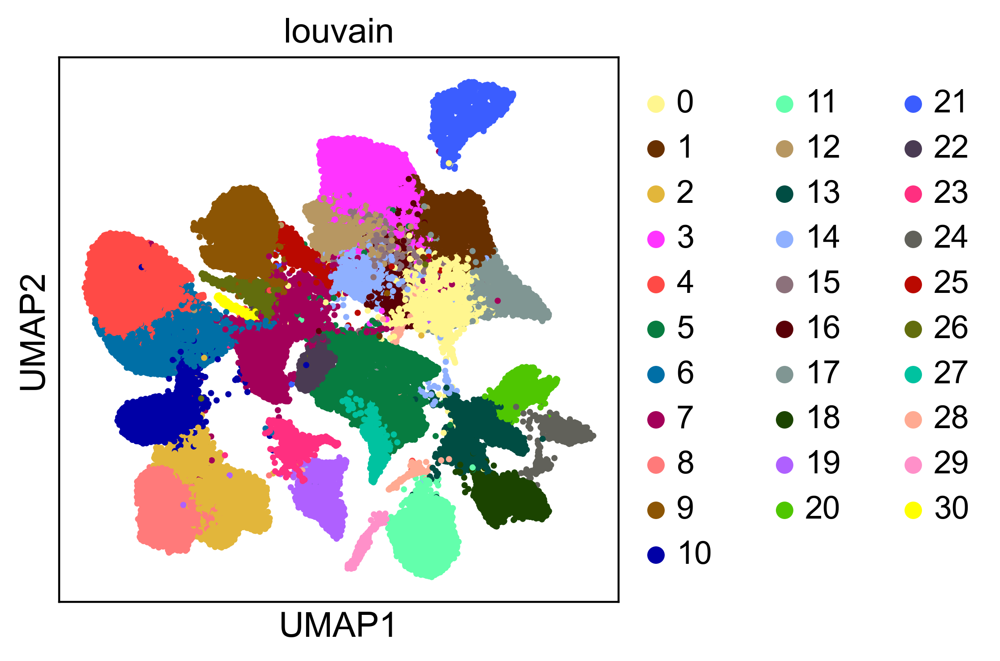

In [8]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=['louvain'], palette=['#fff68f','#683000','#e2b63b','#FF34FF','#FF4A46','#077c40',
                                            '#006FA6','#A30059','#ff7a7a','#8c5504','#0000A6',
                                            '#63FFAC','#B79762','#004D43','#8FB0FF','#8c717b',
                                            '#5A0007','#809693','#1B4400','#af60ff','#4FC601',
                                            '#3B5DFF','#4A3B53','#FF2F80','#61615A','#BA0900',
                                            '#626d0d','#00C2A0','#FFAA92','#FF90C9','#FFFF00','#1CE6FF'], 
           size=25)

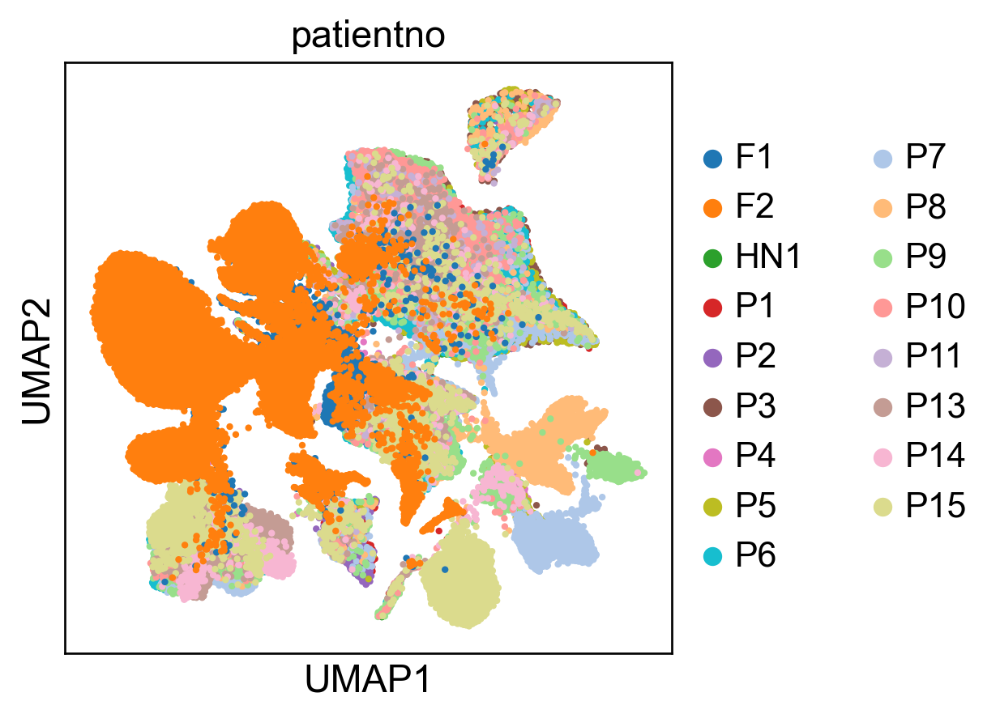

In [12]:
sc.settings.set_figure_params(dpi=120)
sc.pl.umap(adata, color=['patientno'],size=25)

#### Epithelial

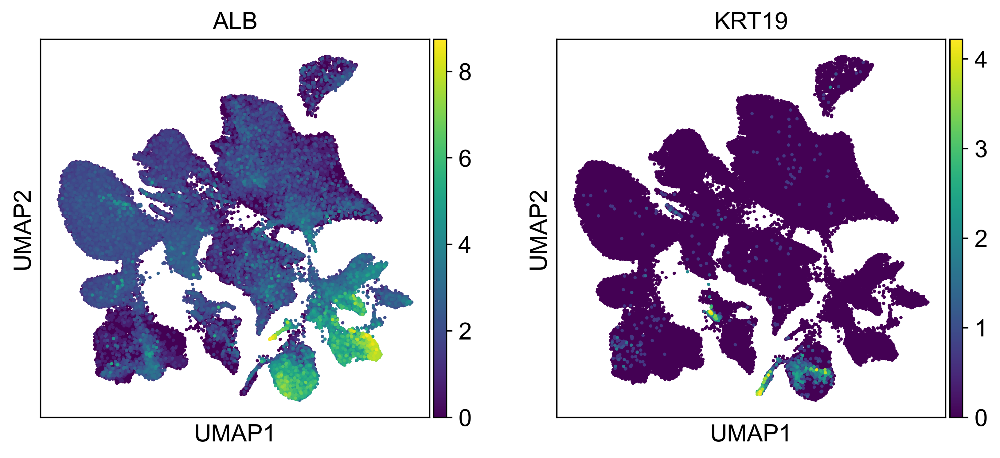

In [10]:
sc.pl.umap(adata, color=['ALB','KRT19'], size=15)

#### Stroma

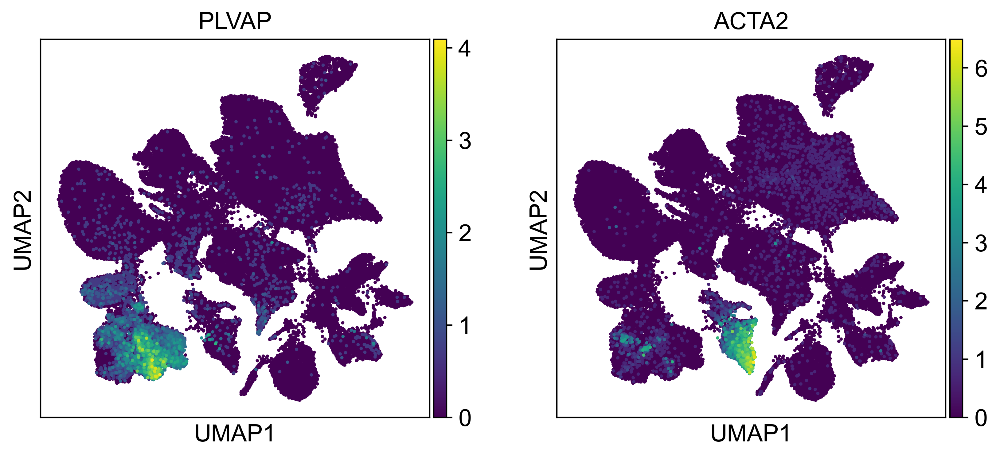

In [11]:
sc.pl.umap(adata, color=['PLVAP','ACTA2'], size=15)

#### Immune

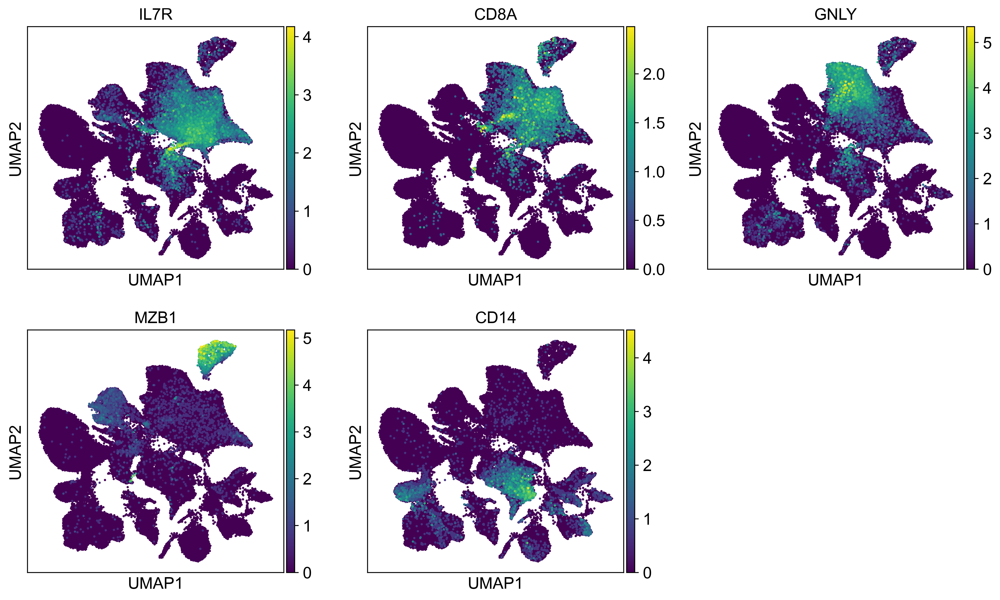

In [6]:
sc.pl.umap(adata, color=['IL7R','CD8A','GNLY','MZB1','CD14'], size=15,ncols=3)

#  

#  Endothelial Cells

In [21]:
adata = sc.read("./data/HF_endothelial.h5ad")
adata

AnnData object with n_obs × n_vars = 16329 × 2384 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'patient_id', 'patientno', 'patient_tumorsection', 'ViralvsNonViral', 'PNC', 'PIC', 'NormalvsTumor', 'Biological_conds', 'biological_cond'
    var: 'gene_ids', 'n_cells'
    uns: 'NormalvsTumor_colors', 'ViralvsNonViral_colors', 'biological_cond_colors', 'diffmap_evals', 'draw_graph', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'patientno_colors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fr', 'X_diffmap', 'X_phate'
    varm: 'PCs'

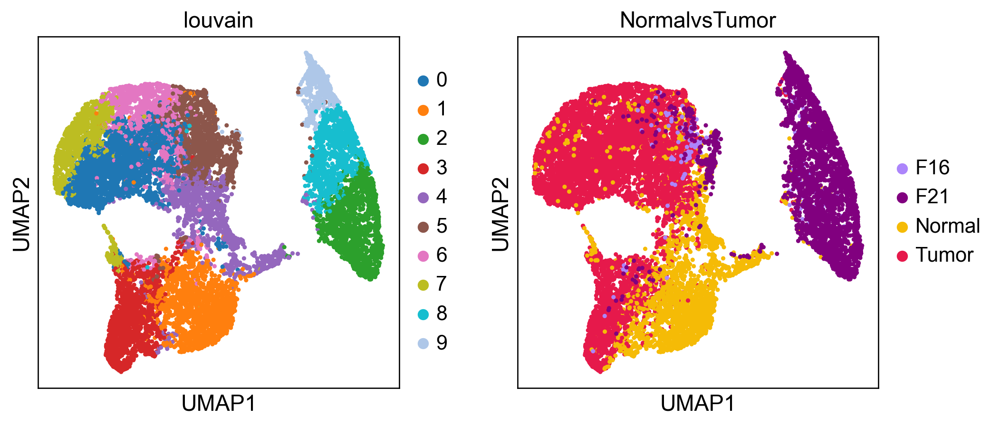

In [22]:
sc.pl.umap(adata, color=['louvain','NormalvsTumor'], size=30)

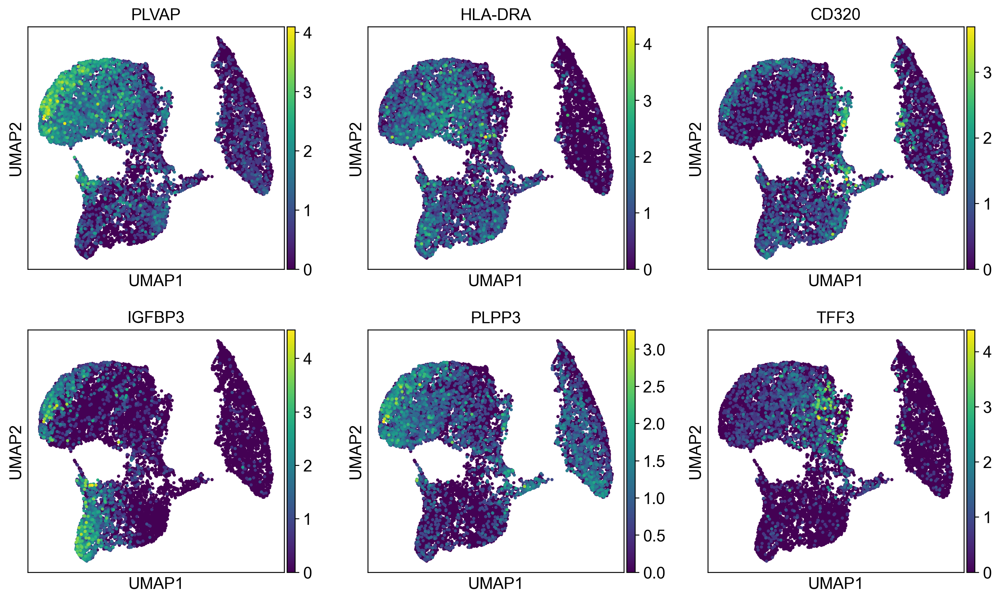

In [23]:
sc.pl.umap(adata, color=['PLVAP','HLA-DRA','CD320','IGFBP3','PLPP3','TFF3'], size=30, ncols=3)

#  

# Myeloid Cells

In [24]:
adata = sc.read("./data/mye_wo_b.h5ad")
adata

AnnData object with n_obs × n_vars = 9307 × 2384 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'patient_id', 'patientno', 'patient_tumorsection', 'ViralvsNonViral', 'PNC', 'PIC', 'NormalvsTumor', 'median genes exp', 'dpt_pseudotime'
    var: 'gene_ids', 'n_cells'
    uns: 'NormalvsTumor_colors', 'ViralvsNonViral_colors', 'diffmap_evals', 'draw_graph', 'iroot', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'patientno_colors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fr', 'X_diffmap'
    varm: 'PCs'

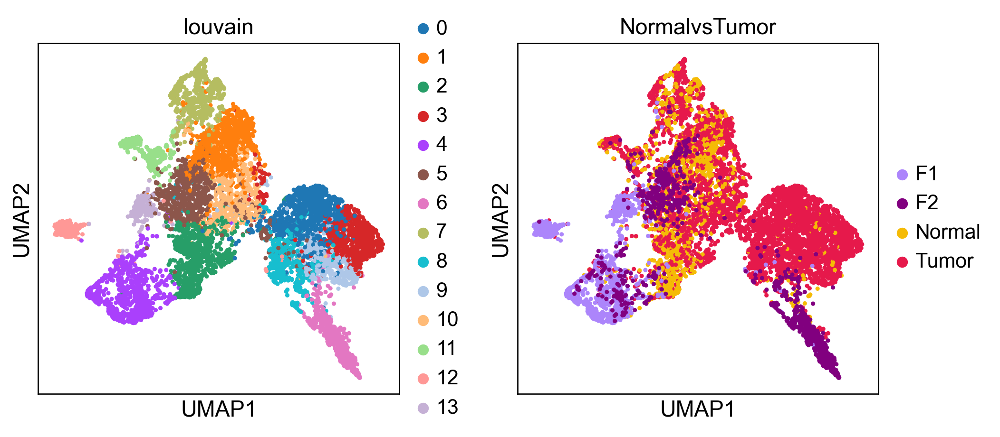

In [27]:
sc.pl.umap(adata, color=['louvain','NormalvsTumor'], size=30)

####  Expression Plot 

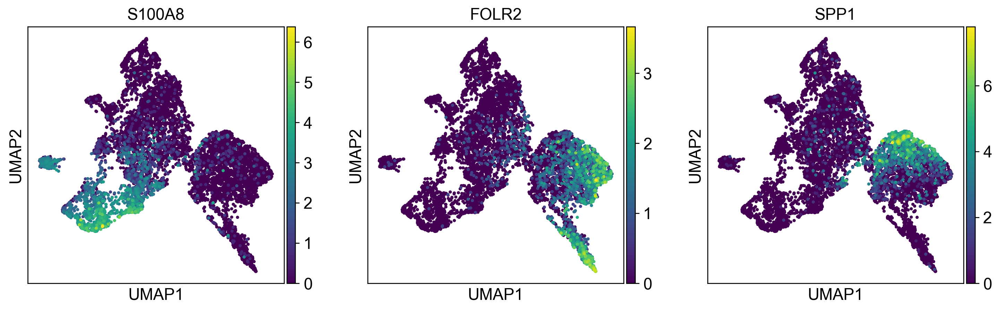

In [26]:
sc.pl.umap(adata, color=['S100A8','FOLR2','SPP1'], size=30)

Trying to set attribute `.uns` of view, copying.


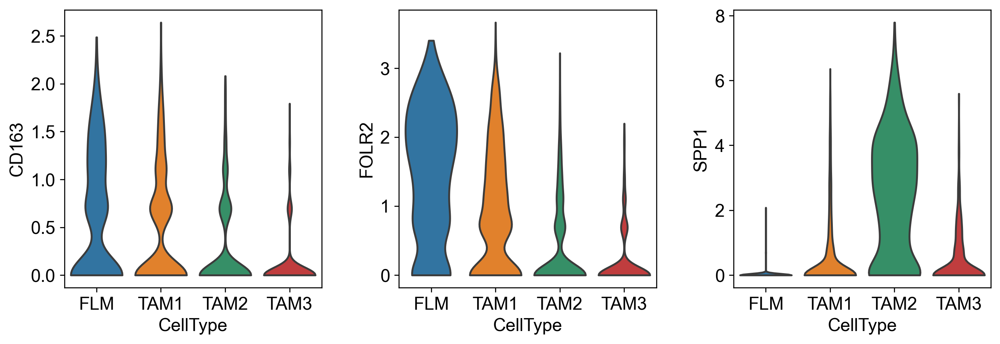

In [36]:
import matplotlib
new_style = {'grid': False}
matplotlib.rc('axes', **new_style)
sc.pl.violin(adata[adata.obs.loc[adata.obs.CellType.isin(['FLM','TAM1','TAM2','TAM3'])].index.tolist(), ],
             ['CD163','FOLR2','SPP1'], groupby='CellType', stripplot=False)